In [5]:
import gc
import os
import time
import collections

import umap
import anndata
import numpy as np
import pandas as pd
import scanpy as sc
import MASI as masi

from scipy import io
from scipy.sparse import csr_matrix

from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.neighbors import NearestNeighbors
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics.cluster import adjusted_rand_score
from sklearn.metrics import normalized_mutual_info_score

#from sccoda.util import comp_ana as mod
#from sccoda.util import cell_composition_data as dat
#rom sccoda.util import data_visualization as viz
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")

In [22]:
#!pip install cosg
#!pip install louvain

In [8]:
#sc.__version__
print(sc.__version__)
print(anndata.__version__)
#print(h5py.__version__)
print()

1.9.2
0.8.0



In [9]:
home      = "/Users/shayat/Documents/Aachen/projects/training_gcb2023/"
datahome  = home+ "data/"
resulthome= home+ "results/"

In [10]:
filename2= "snRNA-seq-submission_training_scleaned_scleaned_target.h5ad"
filename = 'snRNA-seq-submission_training_scleaned_r1_2023.h5ad'

## Code start

In [11]:
source = sc.read_h5ad(datahome+filename)

In [12]:
source

AnnData object with n_obs × n_vars = 38825 × 27592
    obs: 'sample', 'n_counts', 'n_genes', 'percent_mito', 'doublet_score', 'dissociation_score', 'cell_type_original', 'patient_region_id', 'patient', 'patient_group', 'major_labl', 'final_cluster', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'ethnicity_ontology_term_id', 'is_primary_data', 'organism_ontology_term_id', 'sex_ontology_term_id', 'tissue_ontology_term_id', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'scrublet', 'leiden0.1', 'leiden0.3', 'leiden0.5', 'leiden0.7'
    var: 'feature_biotype', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'cell_type_original_colors', 'major_labl_colors', 'rank_genes_groups0.7', 'sample_colors'
    obsm: 'X_harmony', 'X_pca', 'X_pca_harmony', 'X_umap'

In [13]:
sc.pp.filter_cells(source, min_genes=500)
source.obs['Source']="reference"
#source = source[source.obs['compartment']!='PT']
source.obs['cell_type']=source.obs['cell_type_original']
#source.obs['cell_type']=source.obs['compartment']
print(source.X.shape)

(37982, 27592)


In [14]:
target = sc.read_h5ad(datahome+filename2)

#y = pd.read_csv("human_kidney_sn_control_celltype.csv",header=None,index_col=False,sep='\t')
#target.obs['cell_type']=y[0].values
sc.pp.normalize_total(target, target_sum=1e4)
sc.pp.log1p(target)
target.obs['Source']="mytarget"
print(target.X.shape)

(10170, 25411)


In [15]:
# Check to make sure it's still counts
target[:,'TTN'].X.todense()

matrix([[1.8568685],
        [2.4124148],
        [3.296923 ],
        ...,
        [2.887743 ],
        [1.7671882],
        [2.939432 ]], dtype=float32)

In [16]:
var_names = source.var_names.intersection(target.var_names)
#var_names = target2.var_names.intersection(var_names)
#var_names = target3.var_names.intersection(var_names)
#var_names = target4.var_names.intersection(var_names)
#var_names = target5.var_names.intersection(var_names)

source = source[:,var_names]
target = target[:,var_names]
#target2 = target2[:,var_names]
#target3 = target3[:,var_names]
#target4 = target4[:,var_names]
#target5 = target5[:,var_names]

In [17]:
adata = source.concatenate(target)
# adata = sc.read_h5ad("E:h5ad/Kidney_combined.h5ad")

In [18]:
markers = pd.read_csv(datahome + "/human_heart_litviňuková_markers_27.csv",header=0,index_col=False)
cell_markers={}
for m in markers.columns:
    cell_markers[m]=markers[m].values.tolist()

In [19]:
sc.set_figure_params(scanpy=True, dpi=300, dpi_save=300)

In [23]:
##run MASI
marker_list = []
for k, v in cell_markers.items():
    marker_list += v
marker_list = list(set(marker_list))
marker_list = [i for i in marker_list if i in adata.var.index]
len(marker_list)
ad = adata[:,marker_list]

##step 1 expression to cell type score
start_time = time.time()
scores, labels = masi.gene2cell(ad=ad,cell_markers=cell_markers,
                                use_weight=True,if_tfidf=True,if_thresh=True,thresh=0.9)
print('step 1 completed')

##step 2 parallel annotation
#cluster every 50000 cells in each batch
annotation = masi.parallel(scores=scores,labels=labels,batch_size=50000)
annotation = np.array(annotation)
print("--- %s mins ---" % int((time.time() - start_time)/60))

adata.obs['Annotation']=annotation

(48152, 27)
step 1 completed


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


--- 2 mins ---


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


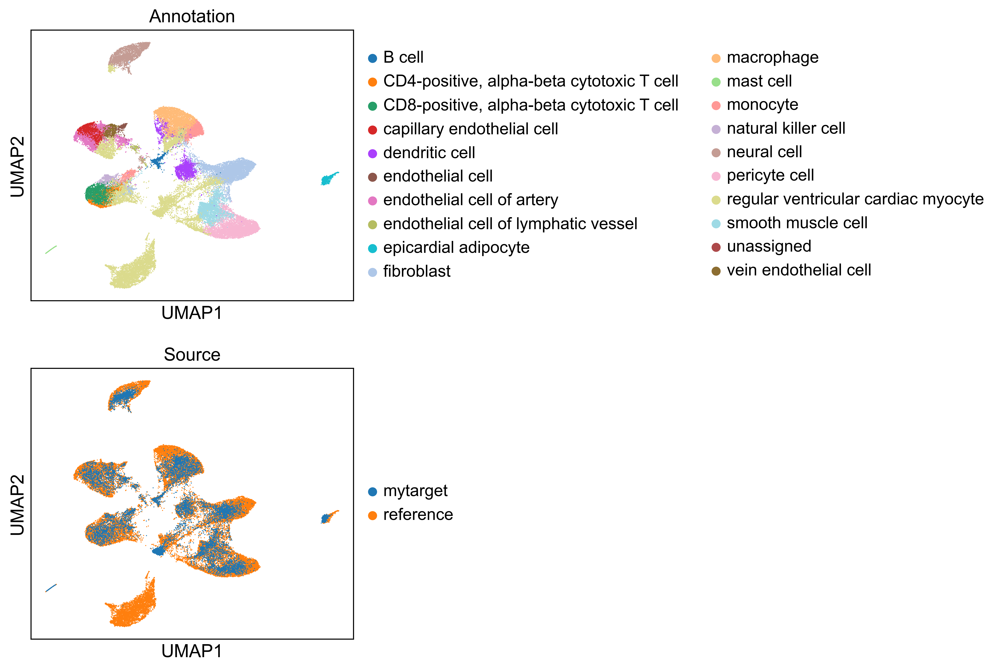

In [24]:
##visualization
down_samp = pd.DataFrame(scores.values)
#down_samp = down_samp.sample(frac=0.5)
umaps = umap.UMAP(n_neighbors=15, min_dist=0.15, n_components=2,
                  metric="cosine").fit(down_samp.values)
embedding = umaps.transform(scores.values)

embedding = pd.DataFrame(embedding)
embedding.columns=['UMAP1','UMAP2']
adata.obsm['X_umap'] = embedding.iloc[:,:2].values
adata.obs['Annotation']=annotation
sc.pl.umap(adata, color=["Annotation","Source"],ncols=1)
#sc.pl.umap(adata, color=["Annotation"],save='kidney.svg')

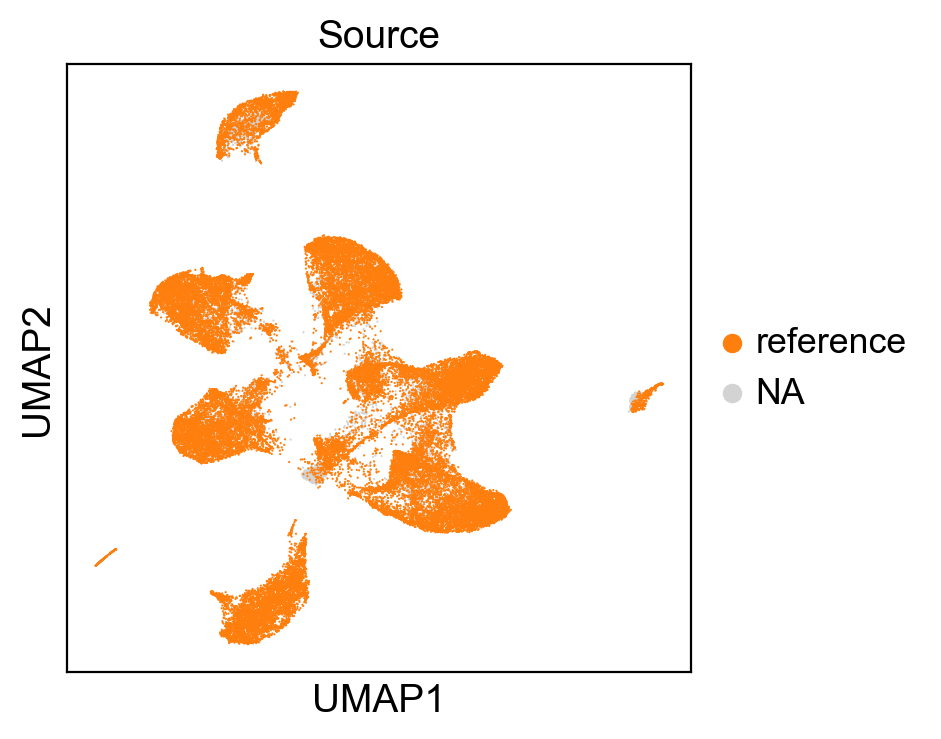

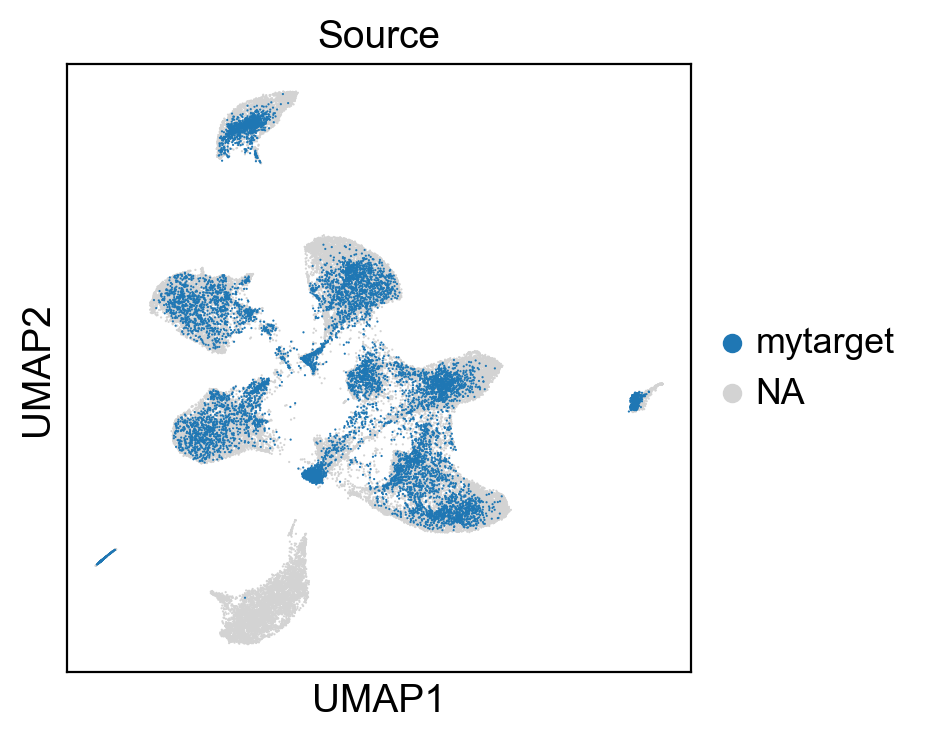

In [25]:
sc.set_figure_params(scanpy=True, dpi=100, dpi_save=100)
for batch in ['reference','mytarget']:
    sc.pl.umap(adata, color='Source', groups=[batch]) #,save=batch+'.svg')

In [26]:
adata

AnnData object with n_obs × n_vars = 48152 × 25410
    obs: 'sample', 'n_counts', 'n_genes', 'percent_mito', 'doublet_score', 'dissociation_score', 'cell_type_original', 'patient_region_id', 'patient', 'patient_group', 'major_labl', 'final_cluster', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'ethnicity_ontology_term_id', 'is_primary_data', 'organism_ontology_term_id', 'sex_ontology_term_id', 'tissue_ontology_term_id', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'scrublet', 'leiden0.1', 'leiden0.3', 'leiden0.5', 'leiden0.7', 'Source', 'cell_type', 'Annotation'
    var: 'feature_biotype', 'mt', 'n_cells-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'n_cells-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1'
    uns: 'Annotation_colors', 'Source_colors'
    obsm: 'X_harmony', 'X_pca', 'X_umap'

In [28]:
adata.obs.head()

,sample,n_counts,n_genes,percent_mito,doublet_score,dissociation_score,cell_type_original,patient_region_id,patient,patient_group,...,total_counts_mt,pct_counts_mt,scrublet,leiden0.1,leiden0.3,leiden0.5,leiden0.7,Source,cell_type,Annotation
ACACCAAGTGTCATGT-1_1_1_1_1_1_1_1_1_1_1_1_1_1_1-0-0,CK158,9255.0,4156,0.086440,0.478381,0.127749,Adipocyte,control_P1,P1,myogenic,...,8.0,0.086440,0.375723,7,7,8,8,reference,Adipocyte,epicardial adipocyte
GTAGGAGTCCGTATAG-1_1_1_1_1_1_1_1_1_1_1_1_1_1_1-0-0,CK158,5917.0,1538,0.033801,0.112845,-0.017195,Adipocyte,control_P1,P1,myogenic,...,2.0,0.033818,0.092742,3,3,2,3,reference,Adipocyte,regular ventricular cardiac myocyte
ACCTGTCGTCTACAGT-1_2_1_1_1_1_1_1_1_1_1_1_1_1_1-0-0,CK159,4226.0,2237,0.189304,0.333294,0.030336,Adipocyte,RZ/FZ_P5,P5,myogenic,...,8.0,0.189304,0.315217,3,3,2,3,reference,Adipocyte,regular ventricular cardiac myocyte
ACTTAGGTCTAATTCC-1_2_1_1_1_1_1_1_1_1_1_1_1_1_1-0-0,CK159,931.0,659,0.214823,0.000417,0.066989,Adipocyte,RZ/FZ_P5,P5,myogenic,...,2.0,0.214823,0.135593,1,1,0,0,reference,Adipocyte,regular ventricular cardiac myocyte
ATAGACCTCAAGCTTG-1_2_1_1_1_1_1_1_1_1_1_1_1_1_1-0-0,CK159,1052.0,791,0.000000,0.000224,0.121526,Adipocyte,RZ/FZ_P5,P5,myogenic,...,0.0,0.000000,0.072519,7,7,8,8,reference,Adipocyte,regular ventricular cardiac myocyte


In [30]:
from collections import Counter
Counter(adata.obs['Source'])

Counter({'reference': 37982, 'mytarget': 10170})

In [31]:
Counter(adata.obs['cell_type'])

Counter({'Adipocyte': 482,
         'Cardiomyocyte': 4932,
         'Cycling cells': 2821,
         'Endothelial': 4799,
         'Fibroblast': 4872,
         'Lymphoid': 4796,
         'Mast': 684,
         'Myeloid': 4773,
         'Neuronal': 2325,
         'Pericyte': 4850,
         'vSMCs': 2648,
         nan: 10170})

In [32]:
Counter(adata.obs['Annotation'])

Counter({'epicardial adipocyte': 853,
         'regular ventricular cardiac myocyte': 13095,
         'smooth muscle cell': 2924,
         'B cell': 599,
         'fibroblast': 5838,
         'pericyte cell': 4950,
         'endothelial cell of artery': 2041,
         'vein endothelial cell': 781,
         'dendritic cell': 2158,
         'neural cell': 3097,
         'endothelial cell of lymphatic vessel': 290,
         'natural killer cell': 620,
         'macrophage': 3764,
         'CD8-positive, alpha-beta cytotoxic T cell': 2267,
         'CD4-positive, alpha-beta cytotoxic T cell': 781,
         'monocyte': 1824,
         'mast cell': 304,
         'capillary endothelial cell': 1667,
         'endothelial cell': 293,
         'unassigned': 6})

In [33]:
pd.crosstab(adata.obs['cell_type_original'], adata.obs['Annotation'])

Annotation,B cell,"CD4-positive, alpha-beta cytotoxic T cell","CD8-positive, alpha-beta cytotoxic T cell",capillary endothelial cell,dendritic cell,endothelial cell,endothelial cell of artery,endothelial cell of lymphatic vessel,epicardial adipocyte,fibroblast,macrophage,mast cell,monocyte,natural killer cell,neural cell,pericyte cell,regular ventricular cardiac myocyte,smooth muscle cell,unassigned,vein endothelial cell
cell_type_original,,,,,,,,,,,,,,,,,,,,
Adipocyte,2,0,0,0,6,0,4,5,846,13,1,0,0,3,8,2,68,5,0,2
Cardiomyocyte,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,5931,0,0,0
Cycling cells,41,37,74,20,2048,4,425,68,0,126,281,4,184,21,16,17,392,29,3,31
Endothelial,3,0,0,1640,4,279,1527,167,1,16,2,1,1,1,9,1,1398,5,0,744
Fibroblast,2,2,0,0,54,6,15,2,2,4800,18,1,14,2,1,8,904,39,0,2
Lymphoid,34,718,2170,4,9,2,17,7,1,368,11,12,131,568,58,16,1645,22,3,0
Mast,449,23,22,0,3,0,3,34,0,5,64,285,374,20,0,0,84,5,0,0
Myeloid,63,0,0,0,9,1,31,4,2,53,3383,0,1117,2,12,2,1090,4,0,0
Neuronal,5,0,1,0,6,1,5,0,0,46,2,0,2,2,2981,11,258,3,0,2


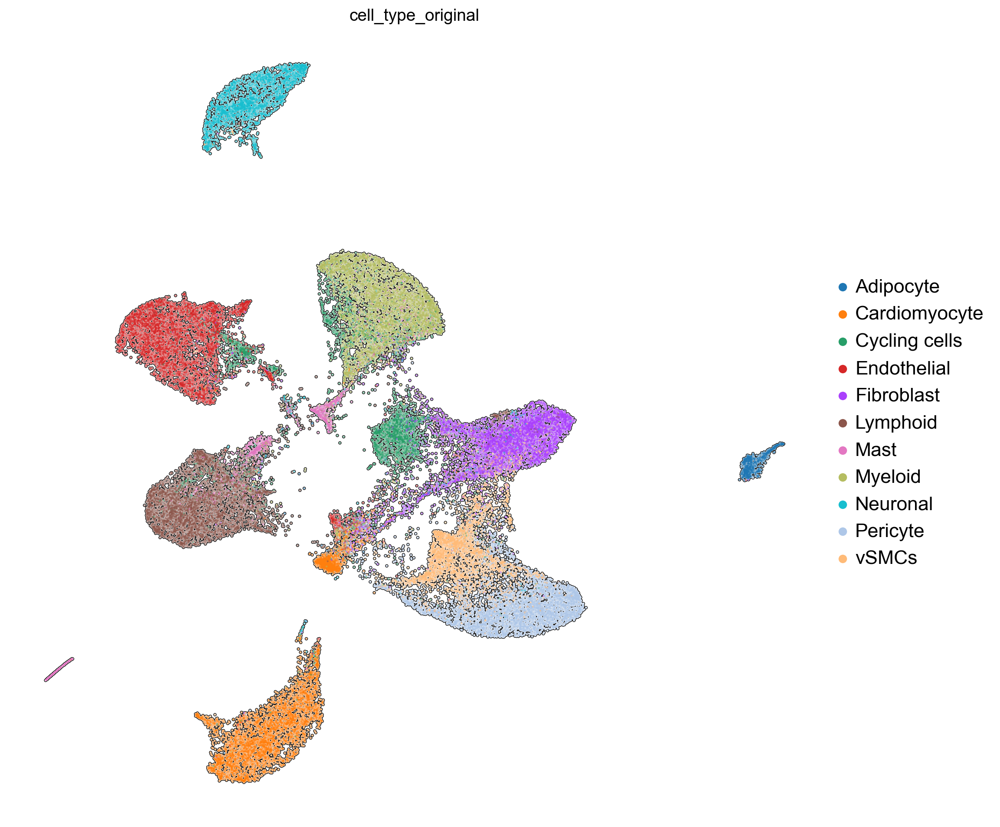

In [37]:
plt.figure(figsize=(12, 12))
sc.pl.embedding(adata, add_outline=True, basis='umap', color='cell_type_original',\
                ax=plt.gca(), alpha=0.5, size=10, legend_fontsize=16,legend_fontoutline=8,\
                frameon=False, show=True)

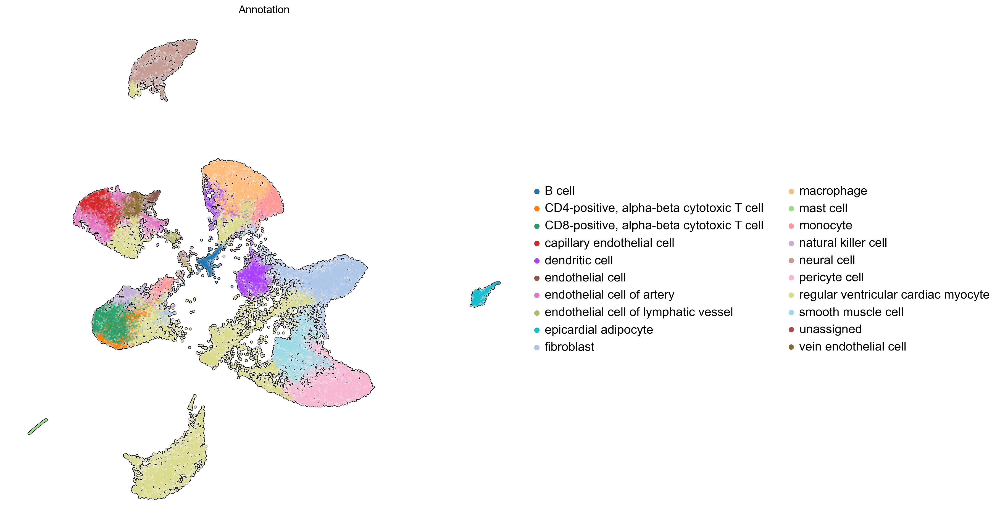

In [38]:
plt.figure(figsize=(12, 12))
sc.pl.embedding(adata, add_outline=True, basis='umap', color='Annotation',\
                ax=plt.gca(), alpha=0.5, size=20, legend_fontsize=16,legend_fontoutline=8,\
                frameon=False, show=True)

In [46]:
tmp_bdata = adata.copy()

In [47]:
sc.pp.normalize_total(tmp_bdata, target_sum=1e4)
sc.pp.log1p(tmp_bdata)

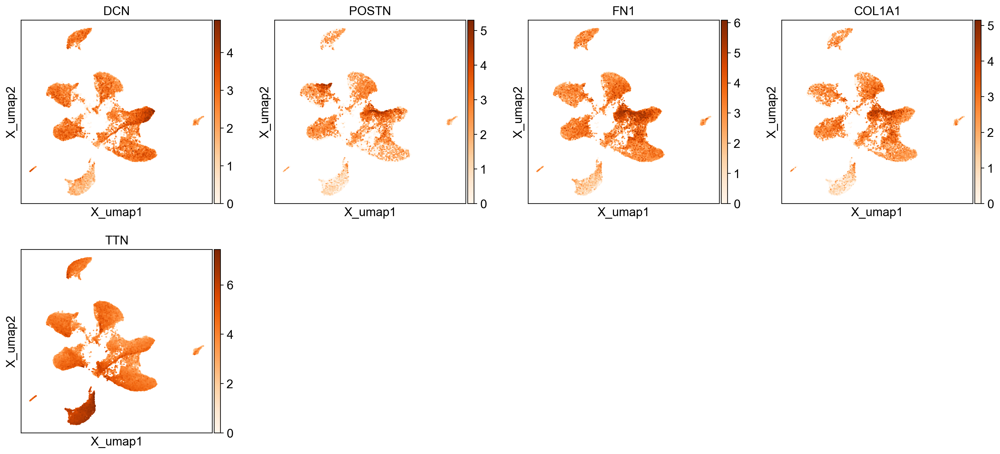

In [54]:
sc.pl.embedding(tmp_bdata, basis='X_umap', color=[\
                     'DCN', 'POSTN', 'FN1', 'COL1A1', 'TTN'], ncols=4,
                color_map='Oranges', size=10)

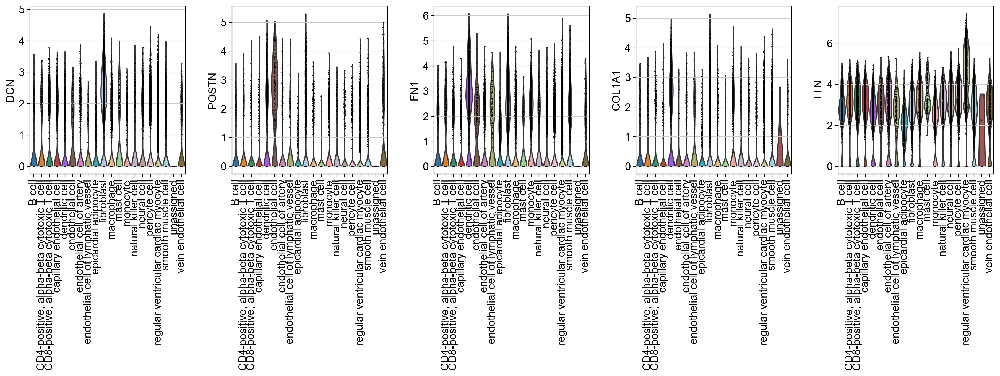

In [53]:
sc.pl.violin(tmp_bdata, ['DCN', 'POSTN', 'FN1', 'COL1A1', 'TTN'], groupby='Annotation', rotation=90, co)

In [60]:
print("Finding markers")
sc.tl.rank_genes_groups(tmp_bdata,
                                groupby='Annotation',
                                key_added='rank_genes_groups' + str('masi'),
                                method='wilcoxon',
                                use_raw=False)

Finding markers


## Plot marker genes

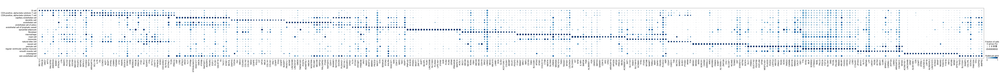

In [61]:
# plot marker genes
#res = 0.9
cluster_id = 'Annotation'

plt.rcParams.update({'font.size': 18})
n = 20

marker_key = 'rank_genes_groups' + str('masi')
#marker_key = 'filter_rank_genes_groups' + str(res)

marker_genes = np.array(tmp_bdata.uns[marker_key]['names'][:(n + 5)].tolist(), 
                        dtype=str).transpose()

unique_markers = []

for k in range(marker_genes.shape[0]):
    i = 0
    for g in marker_genes[k, :]:
        if i < n and g not in unique_markers and g != 'nan':
            unique_markers.append(g)
            i += 1

#unique_markers.append("Postn")

sc.pl.dotplot(tmp_bdata, var_names=unique_markers, groupby='Annotation', \
                                 use_raw=False, vmin=-0.05,
              vmax=1.01,cmap='Blues', standard_scale='var', show=False)

plt.title('Scaled per gene')
plt.show()